# RNN and CURBD analysis - trial averaged data
### Mouse: M062
### Session: 2025_03_19_14_00, 2025_03_20_14_00 & M062_2025_03_21_14_00

#### Imports

In [1]:
# imports
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import savemat
import sys
import os

# Add the project root to sys.path
import sys
sys.path.append('/data/PyalData')

import pyaldata as pyal
import pylab
from collections import Counter
import importlib

from sklearn.decomposition import PCA
from sklearn.cross_decomposition import CCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# for RNN and CURBD
project_root = os.path.abspath(os.path.join(os.getcwd(), '../../../'))
if project_root not in sys.path:
    sys.path.insert(0, project_root)

from tools.curbd import curbd
from tools.dsp.preprocessing import preprocess
from tools.rnn_and_curbd import rnn as rnnz
from tools.rnn_and_curbd import plotting as pltz
from tools.rnn_and_curbd import model_analysis as analyz
from tools.rnn_and_curbd import curbd as curbdz

importlib.reload(rnnz)
importlib.reload(pltz)
importlib.reload(analyz)
importlib.reload(curbdz)

np.random.seed(44)

# 19th March 14:00 session

In [2]:
# Files 
data_dir = "/data/bnd-data/raw/M062/M062_2025_03_19_14_00"
fname0 = os.path.join(data_dir, "M062_2025_03_19_14_00_pyaldata_0.mat")
fname1 = os.path.join(data_dir, "M062_2025_03_19_14_00_pyaldata_1.mat")
fname2 = os.path.join(data_dir, "M062_2025_03_19_14_00_pyaldata_2.mat")


# Load files
df0 = pyal.mat2dataframe(fname0, shift_idx_fields=True)
df1 = pyal.mat2dataframe(fname1, shift_idx_fields=True)
df2 = pyal.mat2dataframe(fname2, shift_idx_fields=True)
df = pd.concat([df0, df1, df2], ignore_index=True)
df = df.drop(columns="all_spikes") # the content is incorrect

field values_before_camera_trigger could not be converted to int.
field idx_before_camera_trigger could not be converted to int.
array field all_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
field values_Sol_direction could not be converted to int.
field idx_Sol_direction could not be converted to int.
field values_Sol_duration could not be converted to int.
field idx_Sol_duration could not be converted to int.
field idx_sol_on could not be converted to int.
array field all_KSLabel could not be converted to i

### Preprocess

In [4]:
for region in ["MOp", "SSp", "CP", "VAL"]:
    print(f"Neurons in {region}: {df[f'{region}_spikes'][0].shape[1]}")

Neurons in MOp: 398
Neurons in SSp: 136
Neurons in CP: 787
Neurons in VAL: 224


In [5]:
df_ = preprocess(df, only_trials=True)

# bin size
BIN_SIZE = df_['bin_size'][0]

# get 'all_rates' column
areas =[ "MOp_rates", "SSp_rates", "CP_rates", "VAL_rates"]
df_ = pyal.merge_signals(df_, areas, "all_rates")

# correct trial length - this is an error in pyaldata
df_['trial_length'] = (df_['trial_length'] / (BIN_SIZE * 100)).astype(int)
df_ = df_[df_['trial_length'] == 200]

/data/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_X might be a time-varying field. It matches the length of VAL_spikes on 99.86149584487535% of trials
  warnings.warn(
/data/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_X might be a time-varying field. It matches the length of VAL_spikes on 99.86149584487535% of trials
  warnings.warn(
/data/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_Y might be a time-varying field. It matches the length of VAL_spikes on 99.86149584487535% of trials
  warnings.warn(
/data/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_Y might be a time-varying field. It matches the length of VAL_spikes on 99.86149584487535% of trials
  warnings.warn(
/data/PyalData/pyaldata/firing_rates.py:108: UserWarning: Assuming spikes are actually spikes and dividing by bin size.
  utils.warnings.warn(
/data/PyalData/pyaldata/firing_rates.py:108: UserWarning: Assuming spikes are actually spikes and dividing by bin size.
  utils

Combined every 3 bins
Resulting VAL_spikes ephys data shape is (NxT): (198, 200)
Resulting SSp_spikes ephys data shape is (NxT): (95, 200)
Resulting CP_spikes ephys data shape is (NxT): (307, 200)
Resulting MOp_spikes ephys data shape is (NxT): (210, 200)


In [6]:
df_.head()

,animal,session,trial_id,trial_name,trial_length,bin_size,idx_trial_start,idx_trial_end,idx_CPI,values_before_camera_trigger,...,MOp_unit_guide,MOp_KSLabel,MOp_spikes,VAL_rates,SSp_rates,CP_rates,MOp_rates,sol_level_id,sol_contra_ipsi,all_rates
0,M062,M062_2025_03_19_14_00,2,trial,200,0.03,16033,16232,[],[],...,"[[250, 1], [250, 2], [251, 1], [252, 3], [254,...","[good, good, good, good, good, good, good, goo...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[12.949475646018982, 0.0, 20.806644360224407,...","[[0.0, 0.0, 2.7987738450368247, 0.0, 26.271029...","[[0.0, 0.9141243373354276, 0.0, 0.0, 0.0, 45.3...","[[0.0, 0.0, 7.159716884295146, 0.0, 20.3504125...",0,1,"[[0.0, 0.0, 7.159716884295146, 0.0, 20.3504125..."
1,M062,M062_2025_03_19_14_00,4,trial,200,0.03,16266,16466,[],[],...,"[[250, 1], [250, 2], [251, 1], [252, 3], [254,...","[good, good, good, good, good, good, good, goo...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 27.146426836649578, 0.000319675170...","[[0.9141243373354276, 0.0, 0.0, 0.0, 7.4161956...","[[0.0, 0.0, 0.21636515545348328, 0.0, 0.0, 56....","[[10.218119621276855, 0.0, 3.9252902070681257,...",1,1,"[[10.218119621276855, 0.0, 3.9252902070681257,..."
2,M062,M062_2025_03_19_14_00,6,trial,200,0.03,16633,16832,[],[],...,"[[250, 1], [250, 2], [251, 1], [252, 3], [254,...","[good, good, good, good, good, good, good, goo...","[[0.0, 0.0, 1.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0,...","[[8.770081400871277, 0.03477109130471945, 30.3...","[[0.0, 0.0, 0.0, 0.0, 24.998068809509277, 0.0,...","[[0.0, 10.218119621276855, 0.2123920402179162,...","[[0.00397311378037557, 0.03477109130471945, 20...",0,1,"[[0.00397311378037557, 0.03477109130471945, 20..."
3,M062,M062_2025_03_19_14_00,8,trial,200,0.03,16933,17132,[],[],...,"[[250, 1], [250, 2], [251, 1], [252, 3], [254,...","[good, good, good, good, good, good, good, goo...","[[0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0,...","[[16.419503092765808, 0.03477109130471945, 7.3...","[[0.0, 0.0, 0.0, 0.0, 29.710056384404503, 3.71...","[[6.201383968194326, 6.201383968194326, 11.514...","[[0.0, 0.0, 0.2123920402179162, 0.0, 12.953768...",1,1,"[[0.0, 0.0, 0.2123920402179162, 0.0, 12.953768..."
4,M062,M062_2025_03_19_14_00,10,trial,200,0.03,17233,17432,[],[],...,"[[250, 1], [250, 2], [251, 1], [252, 3], [254,...","[good, good, good, good, good, good, good, goo...","[[0.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0,...","[[10.430511832237244, 0.0, 35.863637924194336,...","[[0.03477109130471945, 23.16791613896688, 10.2...","[[6.201383968194326, 14.66299593448639, 0.0, 0...","[[10.218119621276855, 15.061257282892864, 13.8...",0,0,"[[10.218119621276855, 15.061257282892864, 13.8..."


### Some parameters

In [7]:
# Get mouse number
mouse = "M062_2025_03_19_14_00_pyaldata_0.mat".split('_')[0]

# perturbation time
perturbation_time = df_.idx_sol_on[0]
perturbation_time_sec = df_.idx_sol_on[0] * BIN_SIZE

# solenoid angles
sol_angles: list = df_.values_Sol_direction.unique()
sol_angles.sort()

# number of trials
num_trials = len(df_)
print(f"Number of trials: {num_trials}")

# Set interpolation factor for RNN 
dtFactor = 2

Number of trials: 359


### Concatenate trials only

In [8]:
# getting trial avg data
trial_avg_rates = rnnz.average_by_trial(df_, sol_angles)
shapes = [arr.shape[0] for arr in trial_avg_rates]

# concatenate data
concat_rates = np.concatenate(trial_avg_rates, axis=0)

print("Averaged activity shape:", trial_avg_rates.shape)
print("Concatenated average activity shape:", concat_rates.shape)

# set up for RNN
trial_avg_activity = np.transpose(concat_rates)
reset_points = rnnz.get_reset_points(df_, trial_avg_activity, areas, dtFactor)
regions_arr = rnnz.get_regions(df_, areas)

print(f"Building {len(regions_arr)} region RNN network")
print(f"Regions: {[region[0] for region in regions_arr]}\n")

Averaged activity shape: (12, 200, 810)
Concatenated average activity shape: (2400, 810)
Trial length: 200
Building 4 region RNN network
Regions: ['MOp', 'SSp', 'CP', 'VAL']



### Plot RNN input

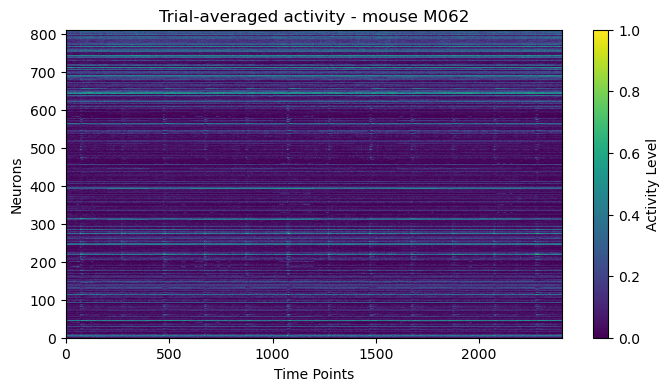

In [9]:
pltz.plot_neuron_activity(rnnz.rescale_array(trial_avg_activity.T), "Trial-averaged activity", mouse)

## RNN training

In [10]:
# RNN hyperparameters
nRunTrain = 5

reset points length: 359
last reset at: 143200
RNN input shape: (810, 2400)
trial=0 pVar=0.948800 chi2=1.687562
trial=1 pVar=0.958811 chi2=1.399177
trial=2 pVar=0.959953 chi2=1.367252
trial=3 pVar=0.962023 chi2=1.293380
trial=4 pVar=0.963411 chi2=1.248112
trial=5 pVar=0.961024 chi2=1.341156


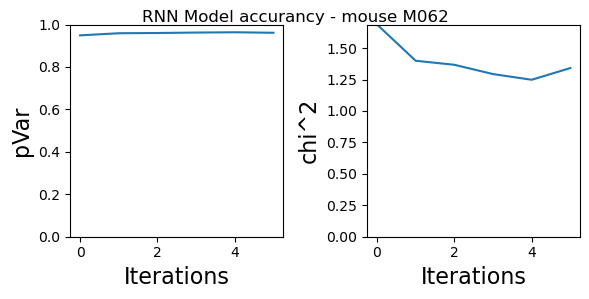

In [11]:
rnn_model, rnn_accuracy_fig = rnnz.run_rnn(trial_avg_activity, reset_points, regions_arr, df_, mouse, dtFactor = dtFactor, nRunTrain = nRunTrain)

### Plot RNN output

In [12]:
rnn_model_ = rnn_model.copy()
rnn_model_['RNN'] = rnnz.combine_rnn_time_bins(rnn_model)

RNN model output transformed from shape: (810, 4799) to (810, 2400). Matching the original data shape of (810, 2400)


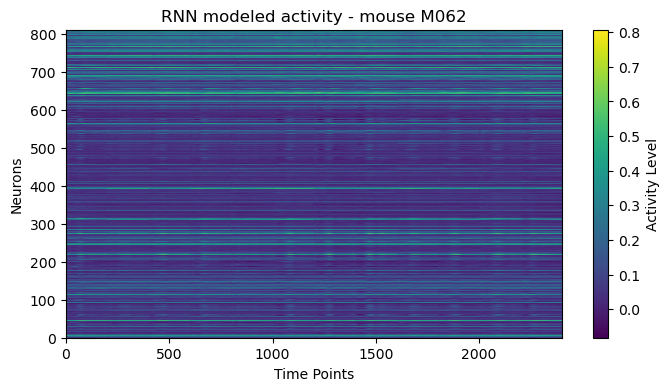

In [13]:
pltz.plot_neuron_activity(rnn_model_['RNN'].T, "RNN modeled activity", mouse)

## Analysis of model fit

### PCA whole model

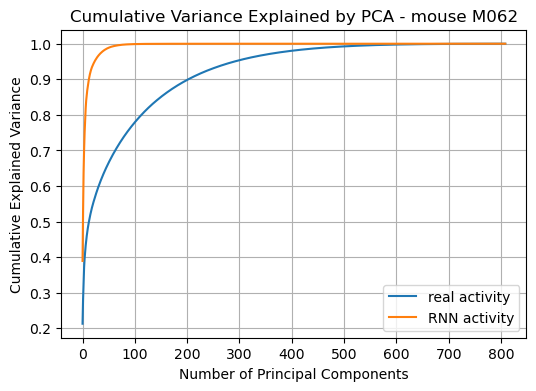

In [14]:
rnn_activity = rnn_model_['RNN'].T
real_activity = rnn_model_['Adata'].T
num_components = rnn_activity.shape[1] - 1

pca_real, pca_data_real = analyz.pca_fit_transform(real_activity, num_components)
pca_rnn, pca_data_rnn = analyz.pca_fit_transform(rnn_activity, num_components)

variance_figure = pltz.plot_pca_cum_var(pca_real, pca_rnn, mouse)

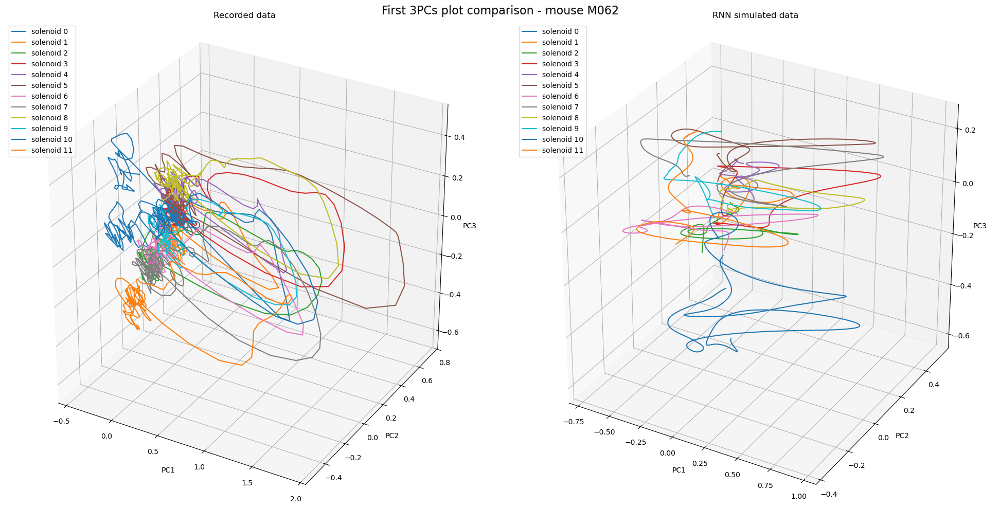

In [15]:
trial_labels = [f"solenoid {angle}" for angle in sol_angles]
PCA_figure = pltz.plot_pca(pca_data_real, pca_data_rnn, shapes, mouse, trial_labels) 

### CCA

In [16]:
model_cca = analyz.canoncorr(pca_data_real, pca_data_rnn)
ctrl1_cca = analyz.canoncorr(pca_data_real, pca_data_real)
ctrl2_cca = analyz.canoncorr(pca_data_rnn, pca_data_rnn)

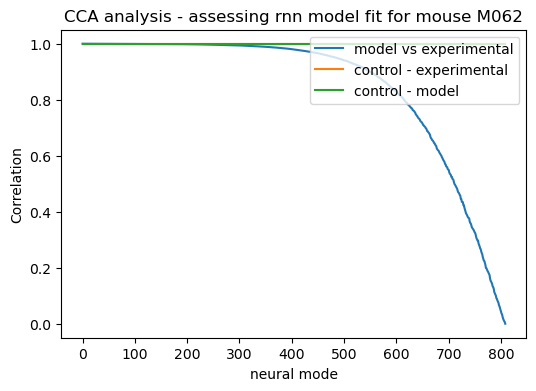

In [17]:
cca_figure = pltz.plot_cca(model_cca, ctrl1_cca, ctrl2_cca, mouse)

### PCA by brain region

In [18]:
PCA_data_real, pcas_real = analyz.pca_by_region(real_activity, regions_arr)
PCA_data_rnn, pcas_rnn = analyz.pca_by_region(rnn_activity, regions_arr)

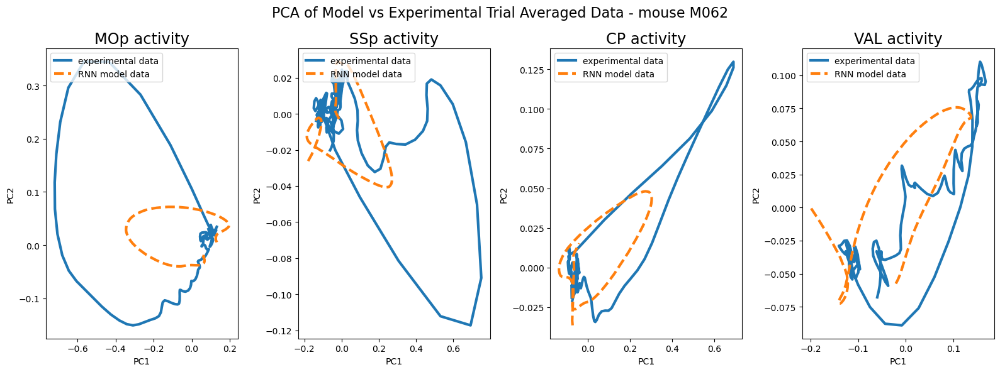

In [19]:
figure = pltz.plot_pca_by_region(PCA_data_real, PCA_data_rnn, shapes, regions_arr, mouse)

### Weight matrix

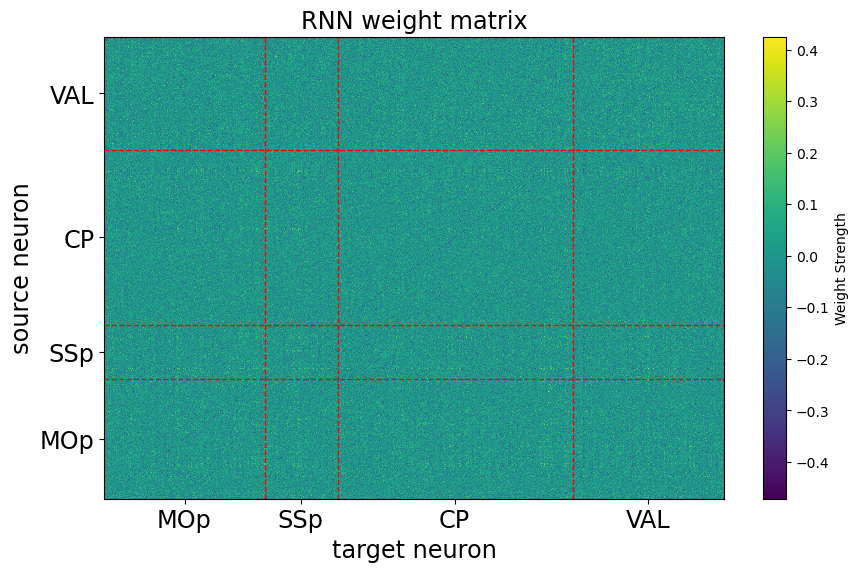

In [20]:
weight_matrix_fig = pltz.plot_rnn_weight_matrix(rnn_model, regions_arr)

### Firing rate analysis

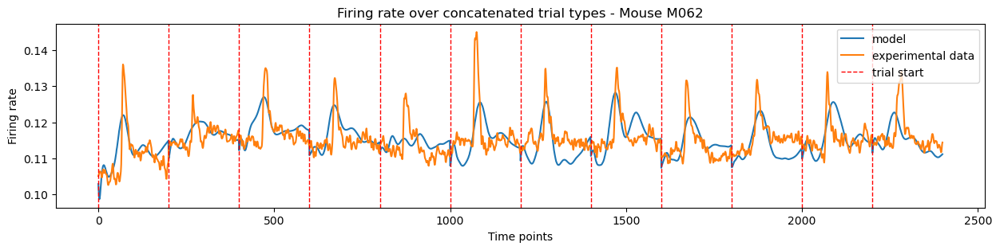

In [21]:
fr_fig = pltz.plot_firing_rates(rnn_model_, reset_points, mouse)

/home/zms24/Desktop/earthquake-analysis/tools/rnn_and_curbd/plotting.py:275: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


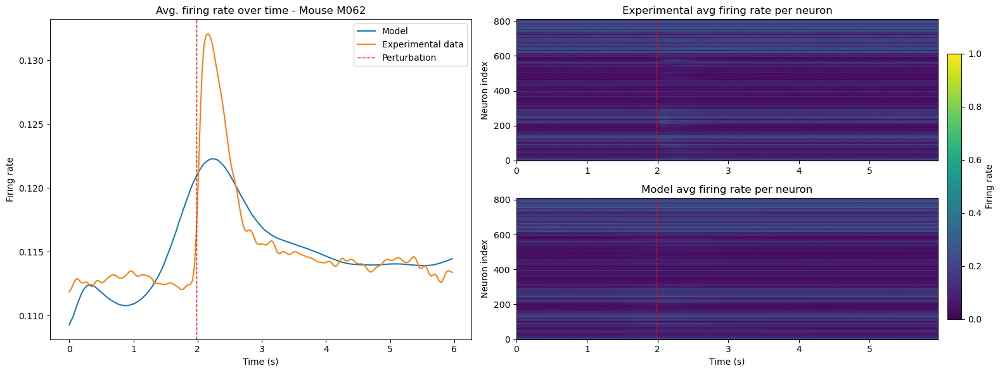

In [22]:
avg_fr_fig = pltz.plot_avg_firing_rates(rnn_model_, shapes, perturbation_time_sec, bin_size=BIN_SIZE, mouse_num=mouse)

## CURBD

In [23]:
curbd_arr, curbd_labels = curbd.computeCURBD(rnn_model)
n_regions = curbd_arr.shape[0]

In [24]:
currents, current_labels = curbdz.format_curbd_output(curbd_arr, curbd_labels, n_regions, reset_points)

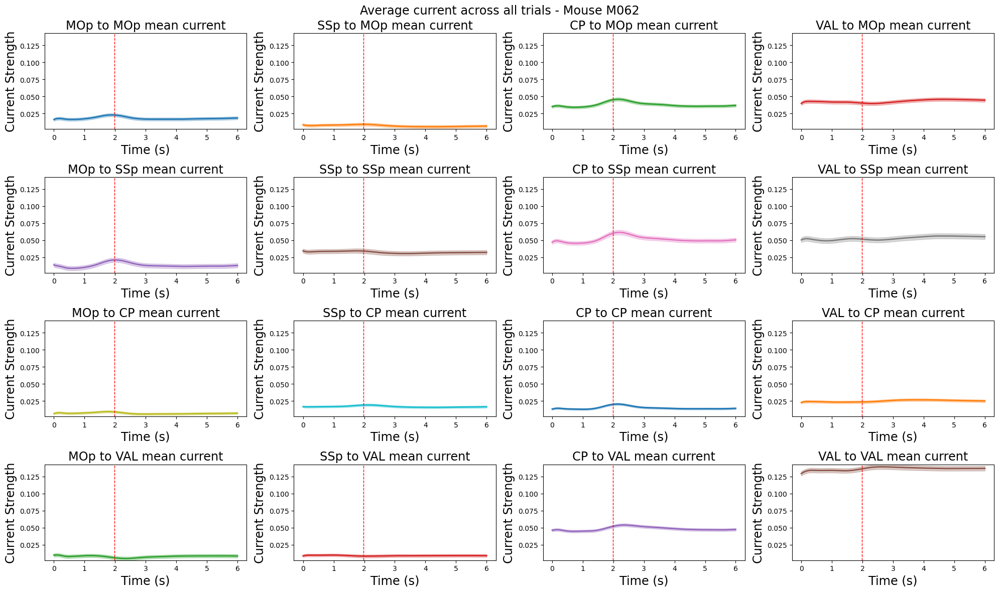

In [25]:
currents_fig = pltz.plot_currents_by_region(currents, current_labels, perturbation_time_sec, BIN_SIZE, dtFactor, mouse)

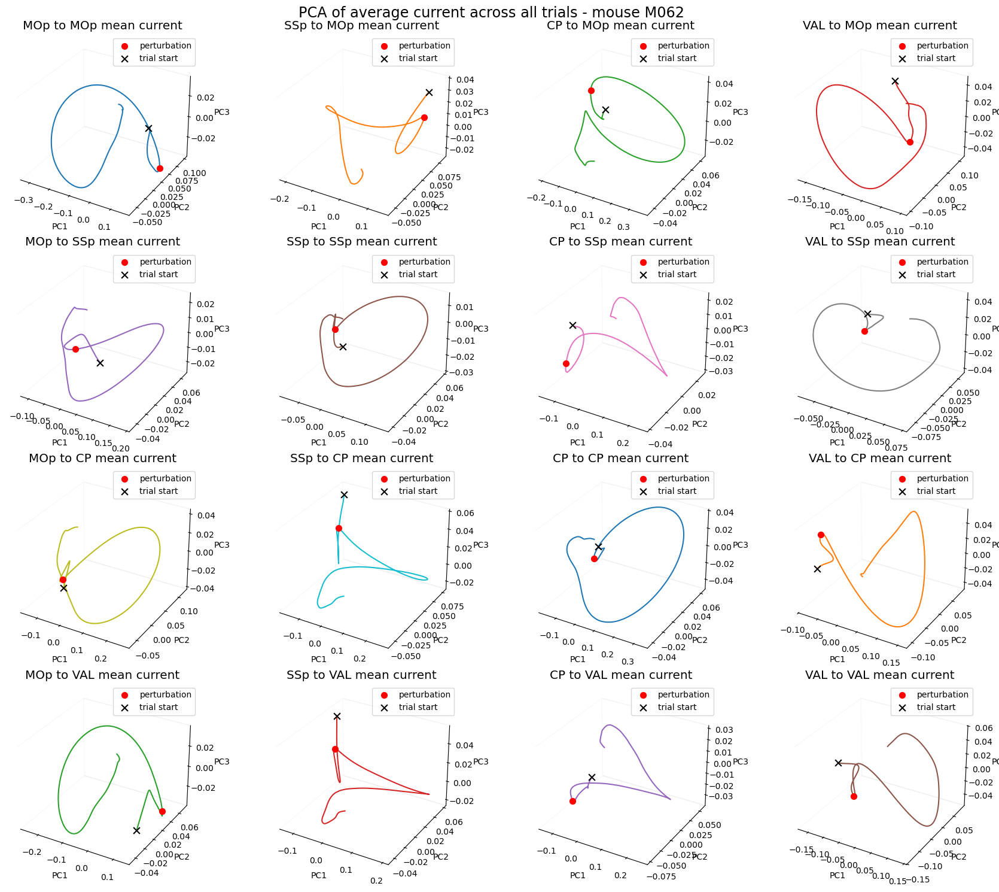

In [26]:
pca_current_fig = pltz.plot_pca_currents(currents, current_labels, perturbation_time, mouse, fig_size = (18, 15))

### Saving RNN model

In [ ]:
rnn_model_to_save = rnn_model.copy()
try:
    if isinstance(rnn_model_to_save['params'].get('nonLinearity'), np.ufunc):
        rnn_model_to_save['params']['nonLinearity'] = rnn_model_to_save['params']['nonLinearity'].__name__
    savemat(f"rnn_model_{mouse}.mat", {"rnn_model": rnn_model_to_save})
except Exception as e:
    print(f"Error saving RNN model for mouse {mouse}:", e)

# 20th March 14:00 session

In [ ]:
# Files 
data_dir = "/data/bnd-data/raw/M062/M062_2025_03_20_14_00"
fname0 = os.path.join(data_dir, "M062_2025_03_20_14_00_pyaldata_0.mat")
fname1 = os.path.join(data_dir, "M062_2025_03_20_14_00_pyaldata_1.mat")
fname2 = os.path.join(data_dir, "M062_2025_03_20_14_00_pyaldata_2.mat")


# Load files
df0 = pyal.mat2dataframe(fname0, shift_idx_fields=True)
df1 = pyal.mat2dataframe(fname1, shift_idx_fields=True)
df2 = pyal.mat2dataframe(fname2, shift_idx_fields=True)
df = pd.concat([df0, df1, df2], ignore_index=True)
df = df.drop(columns="all_spikes") # the content is incorrect

areas=["MOp_spikes", "SSp_spikes", "CP_spikes", "VAL_spikes"]

field values_before_camera_trigger could not be converted to int.
field idx_before_camera_trigger could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
field values_Sol_direction could not be converted to int.
field idx_Sol_direction could not be converted to int.
field values_Sol_duration could not be converted to int.
field idx_Sol_duration could not be converted to int.
field idx_sol_on could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to i

### Preprocess

In [28]:
for region in ["MOp", "SSp", "CP", "VAL"]:
    print(f"Neurons in {region}: {df[f'{region}_spikes'][0].shape[1]}")

Neurons in MOp: 257
Neurons in SSp: 156
Neurons in CP: 753
Neurons in VAL: 175


In [29]:
df_ = preprocess(df, only_trials=True)

# bin size
BIN_SIZE = df_['bin_size'][0]

# get 'all_rates' column
areas =[ "MOp_rates", "SSp_rates", "CP_rates", "VAL_rates"]
df_ = pyal.merge_signals(df_, areas, "all_rates")

# correct trial length - this is an error in pyaldata
df_['trial_length'] = (df_['trial_length'] / (BIN_SIZE * 100)).astype(int)
df_ = df_[df_['trial_length'] == 200]

/data/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_X might be a time-varying field. It matches the length of VAL_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_X might be a time-varying field. It matches the length of VAL_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_Y might be a time-varying field. It matches the length of VAL_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_Y might be a time-varying field. It matches the length of VAL_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/PyalData/pyaldata/firing_rates.py:108: UserWarning: Assuming spikes are actually spikes and dividing by bin size.
  utils.warnings.warn(
/data/PyalData/pyaldata/firing_rates.py:108: UserWarning: Assuming spikes are actually spikes and dividing by bin size.
  utils

Combined every 3 bins
Resulting VAL_spikes ephys data shape is (NxT): (155, 200)
Resulting SSp_spikes ephys data shape is (NxT): (118, 200)
Resulting all_spikes ephys data shape is (NxT): (34, 200)
Resulting MOp_spikes ephys data shape is (NxT): (163, 200)
Resulting CP_spikes ephys data shape is (NxT): (356, 200)


In [30]:
df_.head()

,animal,session,trial_id,trial_name,trial_length,bin_size,idx_trial_start,idx_trial_end,idx_CPI,values_before_camera_trigger,...,CP_unit_guide,CP_KSLabel,CP_spikes,VAL_rates,SSp_rates,all_rates,MOp_rates,CP_rates,sol_level_id,sol_contra_ipsi
0,M062,M062_2025_03_20_14_00,2,trial,200,0.03,16099,16299,[],[],...,"[[3, 1], [4, 1], [5, 1], [5, 5], [6, 2], [7, 1...","[good, good, good, good, mua, good, good, good...","[[0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0,...","[[0.0, 0.0, 0.0, 0.9141243373354276, 0.0, 0.0,...","[[0.0, 0.00397311378037557, 22.701768080393474...","[[0.03477109130471945, 6.413775682449341, 0.0,...","[[0.03477109130471945, 6.413775682449341, 0.0,...","[[0.0, 0.0, 29.36897873878479, 13.016893466313...",0,0
1,M062,M062_2025_03_20_14_00,4,trial,200,0.03,16333,16532,[],[],...,"[[3, 1], [4, 1], [5, 1], [5, 5], [6, 2], [7, 1...","[good, good, good, good, mua, good, good, good...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 12.949475646018982, 0.0, 13.86360029379...","[[0.0, 0.0, 1.1612874766190848, 0.003973113780...","[[0.00397311378037557, 0.0, 0.0, 0.0, 0.0, 6.2...","[[0.00397311378037557, 0.0, 0.0, 0.0, 0.0, 6.2...","[[0.0, 0.0, 6.201383968194326, 0.0, 0.00397311...",0,0
2,M062,M062_2025_03_20_14_00,6,trial,200,0.03,16699,16899,[],[],...,"[[3, 1], [4, 1], [5, 1], [5, 5], [6, 2], [7, 1...","[good, good, good, good, mua, good, good, good...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[17.63444741566976, 0.0, 0.0, 11.811574300130...","[[23.167596260706585, 0.2123920402179162, 4.09...","[[14.242242773373922, 0.00397311378037557, 0.0...","[[14.242242773373922, 0.00397311378037557, 0.0...","[[0.0, 0.9144439672430357, 0.0, 0.0, 0.0, 0.0,...",0,1
3,M062,M062_2025_03_20_14_00,8,trial,200,0.03,17066,17266,[],[],...,"[[3, 1], [4, 1], [5, 1], [5, 5], [6, 2], [7, 1...","[good, good, good, good, mua, good, good, good...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.4142135...","[[0.0, 6.201383968194326, 0.0, 6.2053571144739...","[[0.0, 12.949475646018982, 5.762062470118205, ...","[[20.132402578989666, 0.0, 0.0, 0.0, 0.0, 0.03...","[[20.132402578989666, 0.0, 0.0, 0.0, 0.0, 0.03...","[[0.03477109130471945, 0.0, 0.2123920402179162...",1,1
4,M062,M062_2025_03_20_14_00,10,trial,200,0.03,17433,17632,[],[],...,"[[3, 1], [4, 1], [5, 1], [5, 5], [6, 2], [7, 1...","[good, good, good, good, mua, good, good, good...","[[0.0, 0.0, 1.4142135623730951, 0.0, 0.0, 0.0,...","[[0.0, 0.03509076777845621, 0.0, 3.21614096562...","[[13.863920172055563, 0.03477109130471945, 23....","[[13.072325785954794, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[13.072325785954794, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 6.201383968194326, 33.064295848210655, ...",1,1


### Some paramenters

In [31]:
# perturbation time
perturbation_time = df_.idx_sol_on[0]
perturbation_time_sec = df_.idx_sol_on[0] * BIN_SIZE

# solenoid angles
sol_angles: list = df_.values_Sol_direction.unique()
sol_angles.sort()

# number of trials
num_trials = len(df_)
print(f"Number of trials: {num_trials}")

# Set interpolation factor for RNN 
dtFactor = 2

Number of trials: 354


### Concatenate trials

In [32]:
# getting trial avg data
trial_avg_rates = rnnz.average_by_trial(df_, sol_angles)
shapes = [arr.shape[0] for arr in trial_avg_rates]

# concatenate data
concat_rates = np.concatenate(trial_avg_rates, axis=0)

print("Averaged activity shape:", trial_avg_rates.shape)
print("Concatenated average activity shape:", concat_rates.shape)

# set up for RNN
trial_avg_activity = np.transpose(concat_rates)
reset_points = rnnz.get_reset_points(df_, trial_avg_activity, areas, dtFactor)
regions_arr = rnnz.get_regions(df_, areas)

print(f"Building {len(regions_arr)} region RNN network")
print(f"Regions: {[region[0] for region in regions_arr]}\n")

Averaged activity shape: (12, 200, 792)
Concatenated average activity shape: (2400, 792)
Trial length: 200
Building 4 region RNN network
Regions: ['MOp', 'SSp', 'CP', 'VAL']



### Plot RNN input

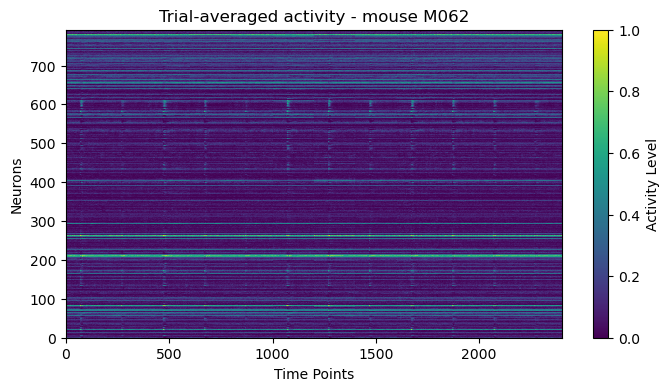

In [33]:
pltz.plot_neuron_activity(rnnz.rescale_array(trial_avg_activity.T), "Trial-averaged activity", mouse)

## RNN training

In [34]:
# RNN hyperparameters
nRunTrain = 5

reset points length: 354
last reset at: 141200
RNN input shape: (792, 2400)
trial=0 pVar=0.952271 chi2=1.781784
trial=1 pVar=0.962429 chi2=1.452566
trial=2 pVar=0.964179 chi2=1.385760
trial=3 pVar=0.964795 chi2=1.357108
trial=4 pVar=0.966884 chi2=1.276628
trial=5 pVar=0.958655 chi2=1.612844


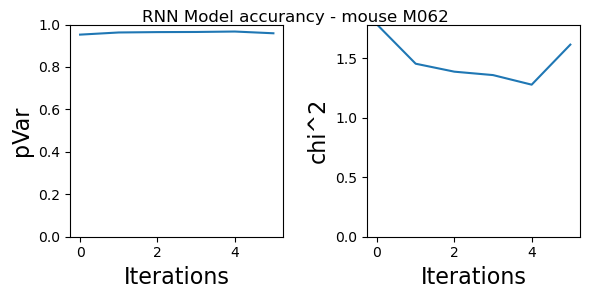

In [35]:
rnn_model, rnn_accuracy_fig = rnnz.run_rnn(trial_avg_activity, reset_points, regions_arr, df_, mouse, dtFactor = dtFactor, nRunTrain = nRunTrain)

### Plot RNN output

In [ ]:
rnn_model_ = rnn_model.copy()
rnn_model_['RNN'] = rnnz.combine_rnn_time_bins(rnn_model)

RNN model output transformed from shape: (792, 4799) to (792, 2400). Matching the original data shape of (792, 2400)


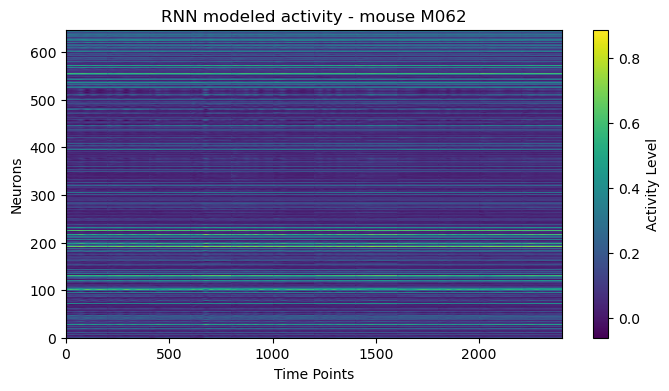

In [60]:
pltz.plot_neuron_activity(rnn_model_['RNN'].T, "RNN modeled activity", mouse)

## Analysis of model fit

### PCA of whole model

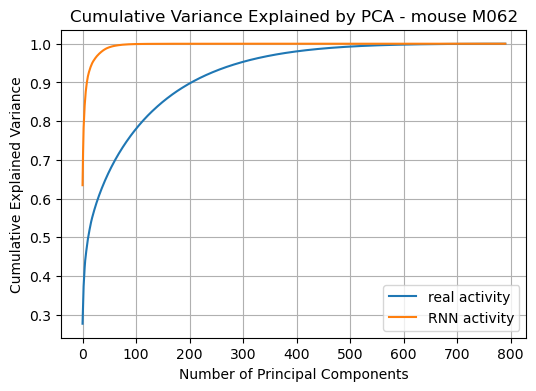

In [38]:
rnn_activity = rnn_model_['RNN'].T
real_activity = rnn_model_['Adata'].T
num_components = rnn_activity.shape[1] - 1

pca_real, pca_data_real = analyz.pca_fit_transform(real_activity, num_components)
pca_rnn, pca_data_rnn = analyz.pca_fit_transform(rnn_activity, num_components)

variance_figure = pltz.plot_pca_cum_var(pca_real, pca_rnn, mouse)

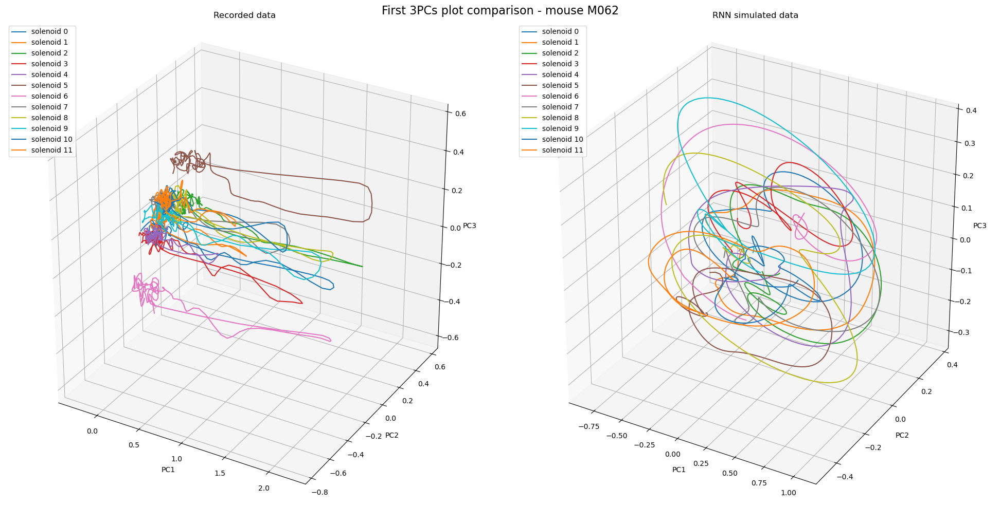

In [39]:
trial_labels = [f"solenoid {angle}" for angle in sol_angles]
PCA_figure = pltz.plot_pca(pca_data_real, pca_data_rnn, shapes, mouse, trial_labels) 

### CCA

In [40]:
model_cca = analyz.canoncorr(pca_data_real, pca_data_rnn)
ctrl1_cca = analyz.canoncorr(pca_data_real, pca_data_real)
ctrl2_cca = analyz.canoncorr(pca_data_rnn, pca_data_rnn)

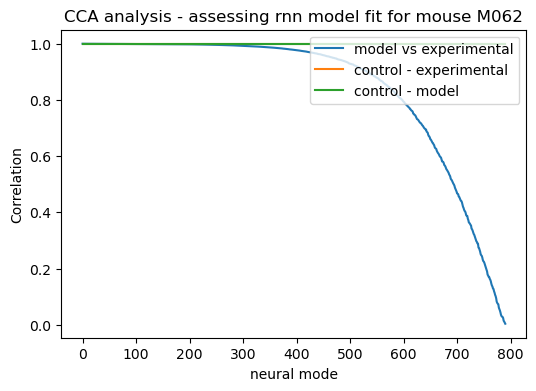

In [41]:
cca_figure = pltz.plot_cca(model_cca, ctrl1_cca, ctrl2_cca, mouse)

### PCA by region

In [42]:
PCA_data_real, pcas_real = analyz.pca_by_region(real_activity, regions_arr)
PCA_data_rnn, pcas_rnn = analyz.pca_by_region(rnn_activity, regions_arr)

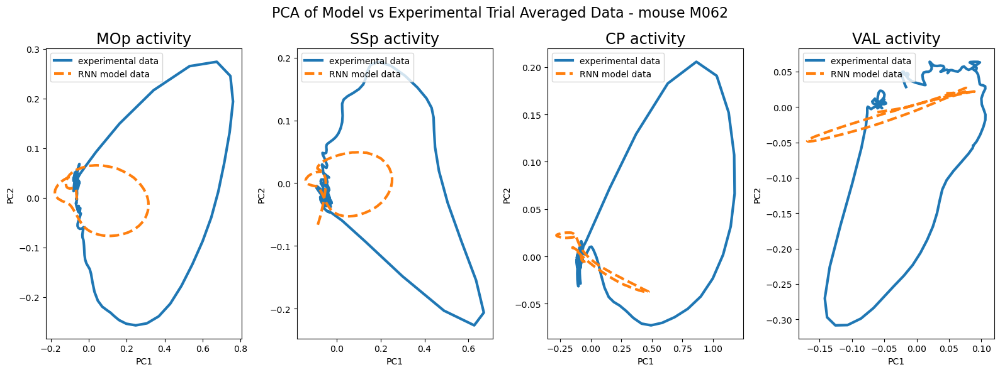

In [43]:
figure = pltz.plot_pca_by_region(PCA_data_real, PCA_data_rnn, shapes, regions_arr, mouse)

### Weight matrix

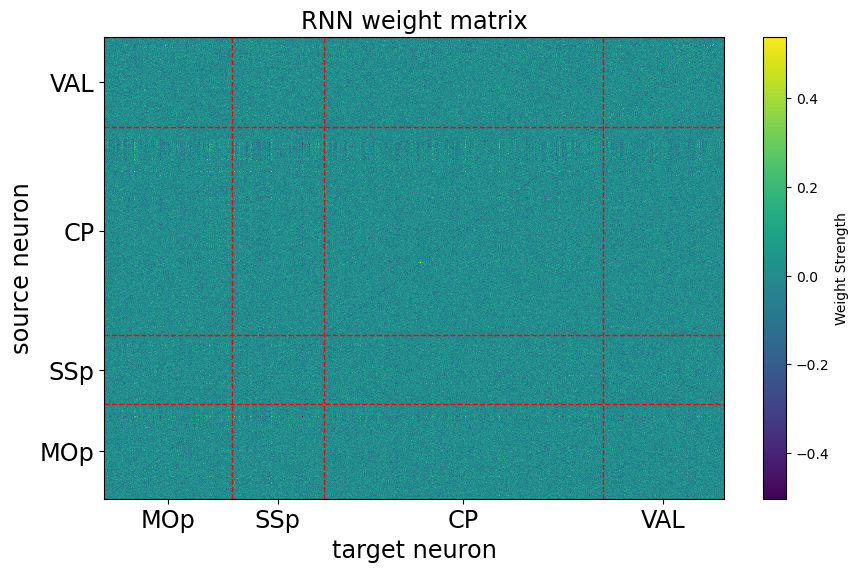

In [44]:
weight_matrix_fig = pltz.plot_rnn_weight_matrix(rnn_model, regions_arr)

### Firing rate analysis

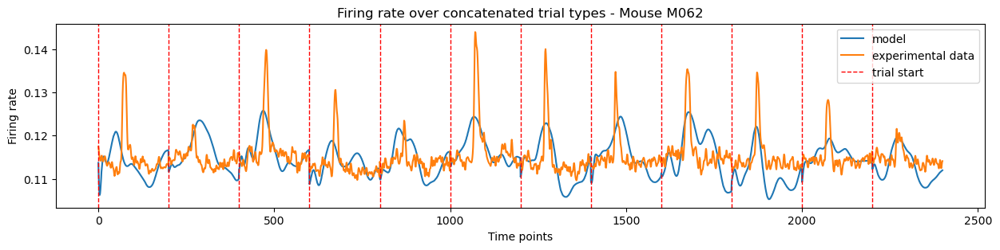

In [45]:
fr_fig = pltz.plot_firing_rates(rnn_model_, reset_points, mouse)

/home/zms24/Desktop/earthquake-analysis/tools/rnn_and_curbd/plotting.py:275: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


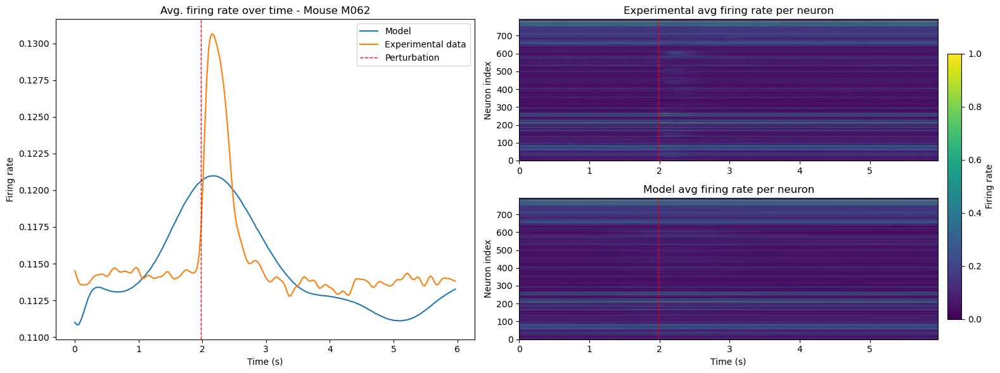

In [46]:
avg_fr_fig = pltz.plot_avg_firing_rates(rnn_model_, shapes, perturbation_time_sec, bin_size=BIN_SIZE, mouse_num=mouse)

## CURBD

In [47]:
curbd_arr, curbd_labels = curbd.computeCURBD(rnn_model)
n_regions = curbd_arr.shape[0]
currents, current_labels = curbdz.format_curbd_output(curbd_arr, curbd_labels, n_regions, reset_points)

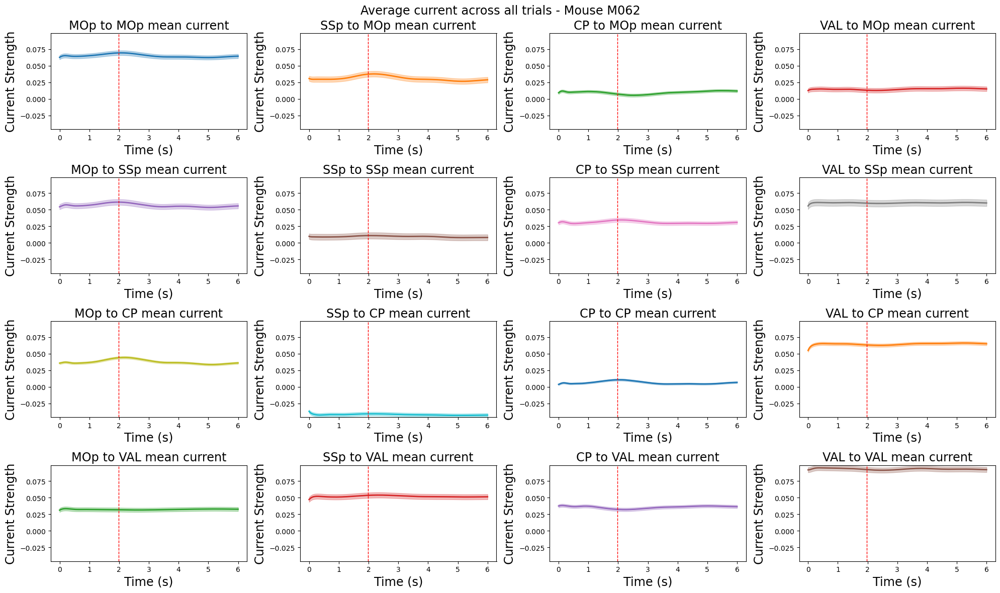

In [48]:
currents_fig = pltz.plot_currents_by_region(currents, current_labels, perturbation_time_sec, BIN_SIZE, dtFactor, mouse)

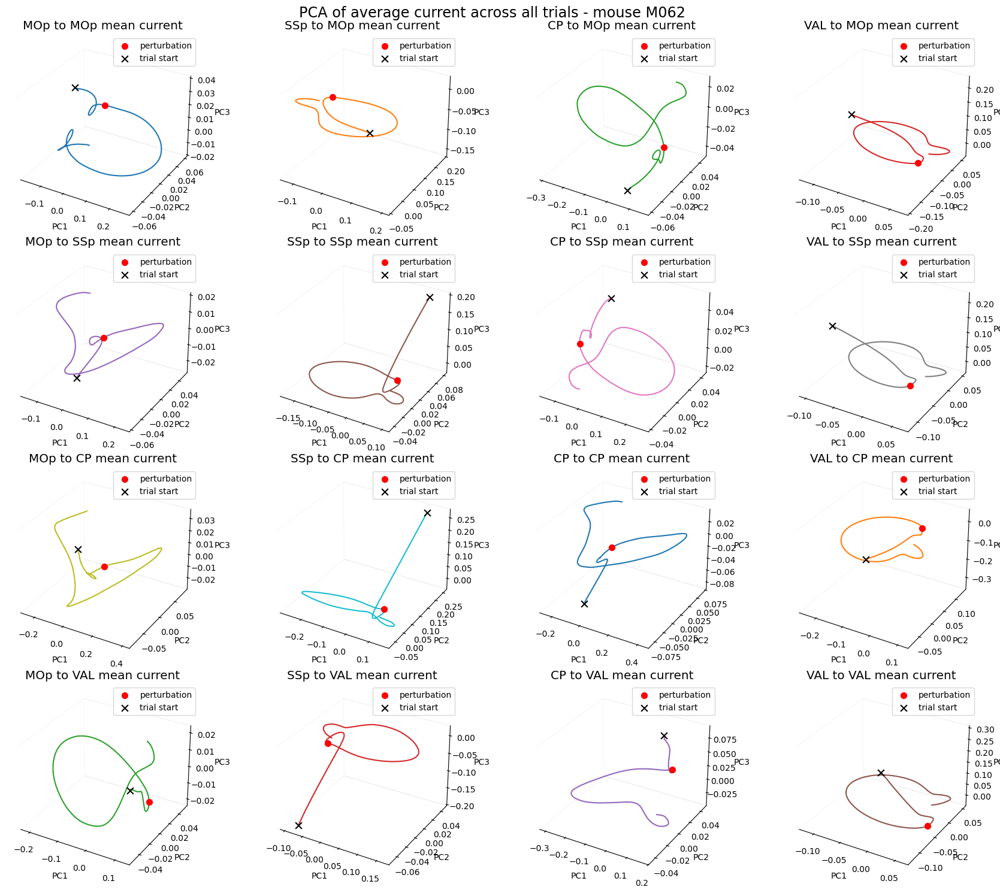

In [49]:
pca_current_fig = pltz.plot_pca_currents(currents, current_labels, perturbation_time, mouse, fig_size = (18, 15))

### Saving RNN model

In [ ]:
rnn_model_to_save = rnn_model.copy()
try:
    if isinstance(rnn_model_to_save['params'].get('nonLinearity'), np.ufunc):
        rnn_model_to_save['params']['nonLinearity'] = rnn_model_to_save['params']['nonLinearity'].__name__
    savemat(f"rnn_model_{mouse}.mat", {"rnn_model": rnn_model_to_save})
except Exception as e:
    print(f"Error saving RNN model for mouse {mouse}:", e)

# 21st March 14:00 session

In [50]:
# Files 
data_dir = "/data/bnd-data/raw/M062/M062_2025_03_21_14_00"
fname0 = os.path.join(data_dir, "M062_2025_03_21_14_00_pyaldata_0.mat")
fname1 = os.path.join(data_dir, "M062_2025_03_21_14_00_pyaldata_1.mat")
fname2 = os.path.join(data_dir, "M062_2025_03_21_14_00_pyaldata_2.mat")


# Load files
df0 = pyal.mat2dataframe(fname0, shift_idx_fields=True)
df1 = pyal.mat2dataframe(fname1, shift_idx_fields=True)
df2 = pyal.mat2dataframe(fname2, shift_idx_fields=True)
df = pd.concat([df0, df1, df2], ignore_index=True)
df = df.drop(columns="all_spikes") # the content is incorrect

areas=["MOp_spikes", "SSp_spikes", "CP_spikes", "VAL_spikes"]

field values_before_camera_trigger could not be converted to int.
field idx_before_camera_trigger could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
field values_Sol_direction could not be converted to int.
field idx_Sol_direction could not be converted to int.
field values_Sol_duration could not be converted to int.
field idx_Sol_duration could not be converted to int.
field idx_sol_on could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
field values_Sol_direction could not be converted t

### Preprocess

In [51]:
for region in ["MOp", "SSp", "CP", "VAL"]:
    print(f"Neurons in {region}: {df[f'{region}_spikes'][0].shape[1]}")

Neurons in MOp: 295
Neurons in SSp: 94
Neurons in CP: 729
Neurons in VAL: 133


In [52]:
df_ = preprocess(df, only_trials=True)

# bin size
BIN_SIZE = df_['bin_size'][0]

# get 'all_rates' column
areas =[ "MOp_rates", "SSp_rates", "CP_rates", "VAL_rates"]
df_ = pyal.merge_signals(df_, areas, "all_rates")

# correct trial length - this is an error in pyaldata
df_['trial_length'] = (df_['trial_length'] / (BIN_SIZE * 100)).astype(int)
df_ = df_[df_['trial_length'] == 200]

/data/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_X might be a time-varying field. It matches the length of VAL_spikes on 99.85875706214689% of trials
  warnings.warn(
/data/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_X might be a time-varying field. It matches the length of VAL_spikes on 99.85875706214689% of trials
  warnings.warn(
/data/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_Y might be a time-varying field. It matches the length of VAL_spikes on 99.85875706214689% of trials
  warnings.warn(
/data/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_Y might be a time-varying field. It matches the length of VAL_spikes on 99.85875706214689% of trials
  warnings.warn(
/data/PyalData/pyaldata/firing_rates.py:108: UserWarning: Assuming spikes are actually spikes and dividing by bin size.
  utils.warnings.warn(
/data/PyalData/pyaldata/firing_rates.py:108: UserWarning: Assuming spikes are actually spikes and dividing by bin size.
  utils

Combined every 3 bins
Resulting VAL_spikes ephys data shape is (NxT): (122, 200)
Resulting SSp_spikes ephys data shape is (NxT): (66, 200)
Resulting CP_spikes ephys data shape is (NxT): (280, 200)
Resulting MOp_spikes ephys data shape is (NxT): (179, 200)


In [53]:
df_.head()

,animal,session,trial_id,trial_name,trial_length,bin_size,idx_trial_start,idx_trial_end,idx_CPI,values_before_camera_trigger,...,MOp_unit_guide,MOp_KSLabel,MOp_spikes,VAL_rates,SSp_rates,CP_rates,MOp_rates,sol_level_id,sol_contra_ipsi,all_rates
0,M062,M062_2025_03_21_14_00,2,trial,200,0.03,16033,16232,[],[],...,"[[250, 2], [251, 1], [251, 2], [252, 4], [253,...","[good, good, good, good, good, mua, good, mua,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[6.4485470453898115, 0.0, 33.71282418568929, ...","[[0.9141243373354276, 28.6065677801768, 2.7987...","[[0.0, 0.0, 19.15117899576823, 12.949475646018...","[[10.252890984217327, 10.218119621276855, 0.91...",1,0,"[[10.252890984217327, 10.218119621276855, 0.91..."
1,M062,M062_2025_03_21_14_00,4,trial,200,0.03,16333,16532,[],[],...,"[[250, 2], [251, 1], [251, 2], [252, 4], [253,...","[good, good, good, good, good, mua, good, mua,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.9488953898350398, 0.0, 50.464606285095215,...","[[0.0, 17.119932174682617, 0.0, 3.011165807644...","[[6.205357114473979, 0.0, 13.05166482925415, 0...","[[2.7987738450368247, 0.03509076777845621, 0.2...",1,0,"[[2.7987738450368247, 0.03509076777845621, 0.2..."
2,M062,M062_2025_03_21_14_00,6,trial,200,0.03,16566,16766,[],[],...,"[[250, 2], [251, 1], [251, 2], [252, 4], [253,...","[good, good, good, good, good, mua, good, mua,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.21636515545348328, 0.0003196751701276905, ...","[[0.0, 11.727251609166464, 9.000157316525778, ...","[[0.00397311378037557, 0.0, 0.9141243373354276...","[[2.7987738450368247, 0.0, 6.201383968194326, ...",1,1,"[[2.7987738450368247, 0.0, 6.201383968194326, ..."
3,M062,M062_2025_03_21_14_00,8,trial,200,0.03,16866,17066,[],[],...,"[[250, 2], [251, 1], [251, 2], [252, 4], [253,...","[good, good, good, good, good, mua, good, mua,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[38.4849230448405, 6.201383968194326, 9.90057...","[[0.0, 41.048288345336914, 18.348095814387005,...","[[0.0, 0.0, 0.00397311378037557, 0.91444396724...","[[0.00397311378037557, 0.03874420654028654, 2....",1,1,"[[0.00397311378037557, 0.03874420654028654, 2...."
4,M062,M062_2025_03_21_14_00,10,trial,200,0.03,17233,17432,[],[],...,"[[250, 2], [251, 1], [251, 2], [252, 4], [253,...","[good, good, good, good, good, mua, good, mua,...","[[0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0,...","[[12.949475646018982, 0.0, 0.9144439672430357,...","[[0.0, 24.343605836232506, 0.9141243373354276,...","[[0.00397311378037557, 0.0003196751701276905, ...","[[0.0, 0.0, 0.21636515545348328, 0.0, 12.94947...",1,1,"[[0.0, 0.0, 0.21636515545348328, 0.0, 12.94947..."


### Some parameters

In [54]:
# perturbation time
perturbation_time = df_.idx_sol_on[0]
perturbation_time_sec = df_.idx_sol_on[0] * BIN_SIZE

# solenoid angles
sol_angles: list = df_.values_Sol_direction.unique()
sol_angles.sort()

# number of trials
num_trials = len(df_)
print(f"Number of trials: {num_trials}")

# Set interpolation factor for RNN 
dtFactor = 2

Number of trials: 352


### Concat trials

In [55]:
# getting trial avg data
trial_avg_rates = rnnz.average_by_trial(df_, sol_angles)
shapes = [arr.shape[0] for arr in trial_avg_rates]

# concatenate data
concat_rates = np.concatenate(trial_avg_rates, axis=0)

print("Averaged activity shape:", trial_avg_rates.shape)
print("Concatenated average activity shape:", concat_rates.shape)

# set up for RNN
trial_avg_activity = np.transpose(concat_rates)
reset_points = rnnz.get_reset_points(df_, trial_avg_activity, areas, dtFactor)
regions_arr = rnnz.get_regions(df_, areas)

print(f"Building {len(regions_arr)} region RNN network")
print(f"Regions: {[region[0] for region in regions_arr]}\n")

Averaged activity shape: (12, 200, 647)
Concatenated average activity shape: (2400, 647)
Trial length: 200
Building 4 region RNN network
Regions: ['MOp', 'SSp', 'CP', 'VAL']



### Plot RNN input

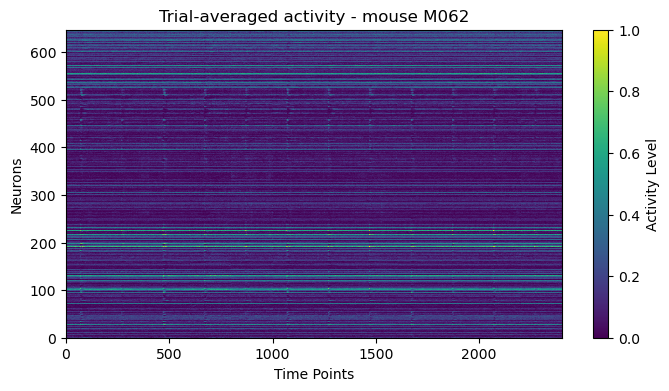

In [56]:
pltz.plot_neuron_activity(rnnz.rescale_array(trial_avg_activity.T), "Trial-averaged activity", mouse)

## RNN training

In [57]:
# RNN hyperparameters
nRunTrain = 5

reset points length: 352
last reset at: 140400
RNN input shape: (647, 2400)
trial=0 pVar=0.947090 chi2=1.828423
trial=1 pVar=0.958148 chi2=1.480578
trial=2 pVar=0.959500 chi2=1.432970
trial=3 pVar=0.960456 chi2=1.396220
trial=4 pVar=0.962633 chi2=1.320086
trial=5 pVar=0.955697 chi2=1.577714


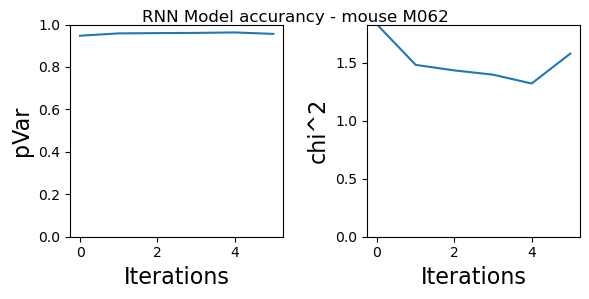

In [58]:
rnn_model, rnn_accuracy_fig = rnnz.run_rnn(trial_avg_activity, reset_points, regions_arr, df_, mouse, dtFactor = dtFactor, nRunTrain = nRunTrain)

### Plot RNN output

In [59]:
rnn_model_ = rnn_model.copy()
rnn_model_['RNN'] = rnnz.combine_rnn_time_bins(rnn_model)

RNN model output transformed from shape: (647, 4799) to (647, 2400). Matching the original data shape of (647, 2400)


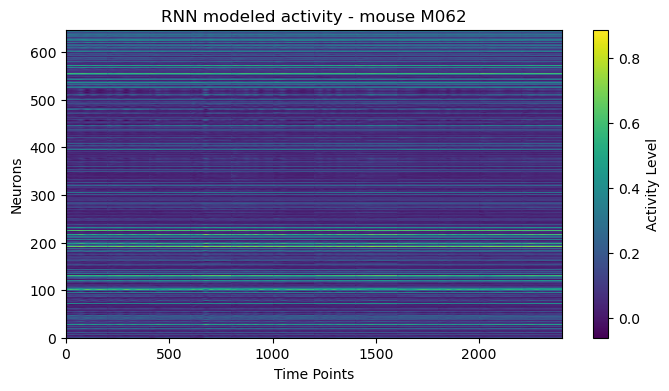

In [62]:
pltz.plot_neuron_activity(rnn_model_['RNN'].T, "RNN modeled activity", mouse)

## Analysis of model fit
### PCA of whole model

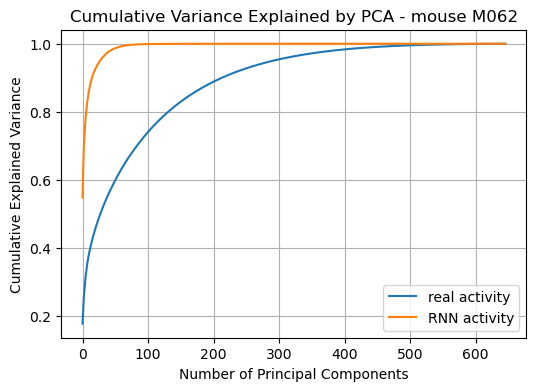

In [63]:
rnn_activity = rnn_model_['RNN'].T
real_activity = rnn_model_['Adata'].T
num_components = rnn_activity.shape[1] - 1

pca_real, pca_data_real = analyz.pca_fit_transform(real_activity, num_components)
pca_rnn, pca_data_rnn = analyz.pca_fit_transform(rnn_activity, num_components)

variance_figure = pltz.plot_pca_cum_var(pca_real, pca_rnn, mouse)

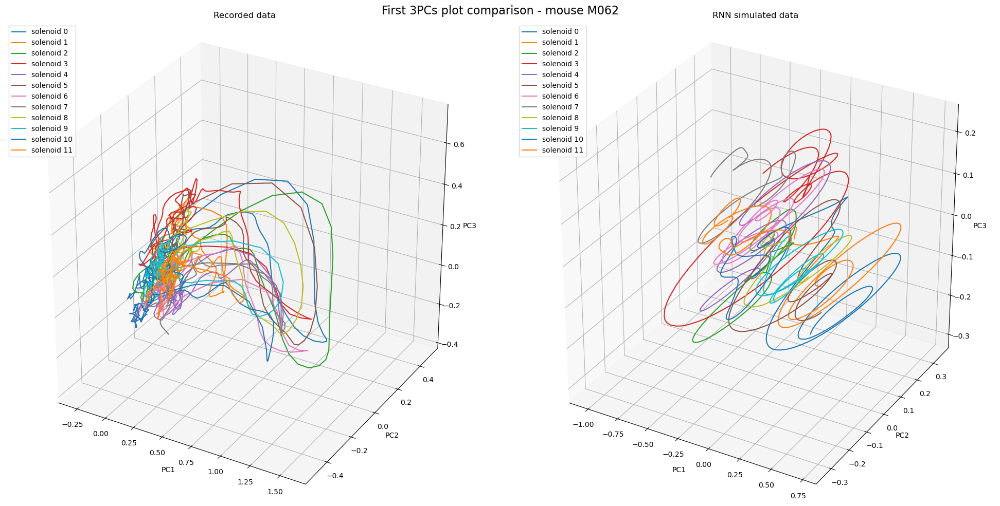

In [64]:
trial_labels = [f"solenoid {angle}" for angle in sol_angles]
PCA_figure = pltz.plot_pca(pca_data_real, pca_data_rnn, shapes, mouse, trial_labels) 

### CCA

In [65]:
model_cca = analyz.canoncorr(pca_data_real, pca_data_rnn)
ctrl1_cca = analyz.canoncorr(pca_data_real, pca_data_real)
ctrl2_cca = analyz.canoncorr(pca_data_rnn, pca_data_rnn)

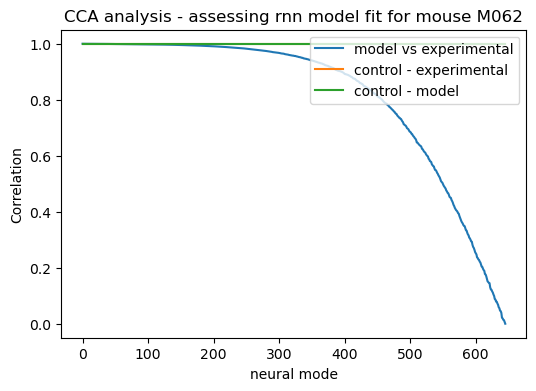

In [66]:
cca_figure = pltz.plot_cca(model_cca, ctrl1_cca, ctrl2_cca, mouse)

### PCA by region

In [67]:
PCA_data_real, pcas_real = analyz.pca_by_region(real_activity, regions_arr)
PCA_data_rnn, pcas_rnn = analyz.pca_by_region(rnn_activity, regions_arr)

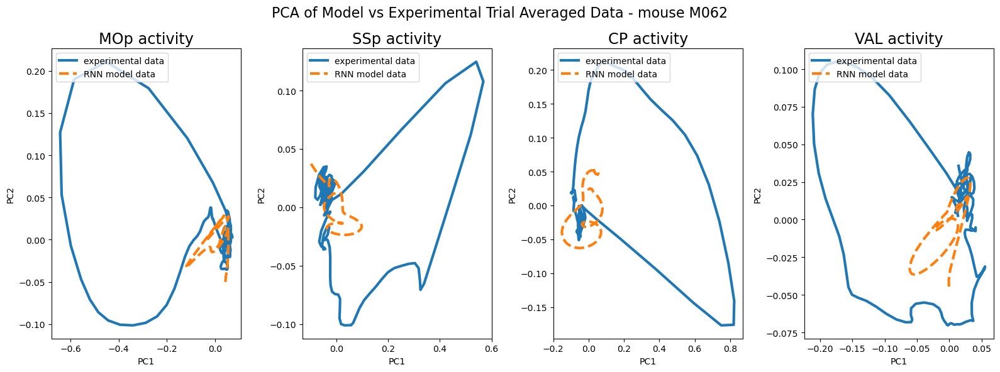

In [68]:
figure = pltz.plot_pca_by_region(PCA_data_real, PCA_data_rnn, shapes, regions_arr, mouse)

### Weight matrix

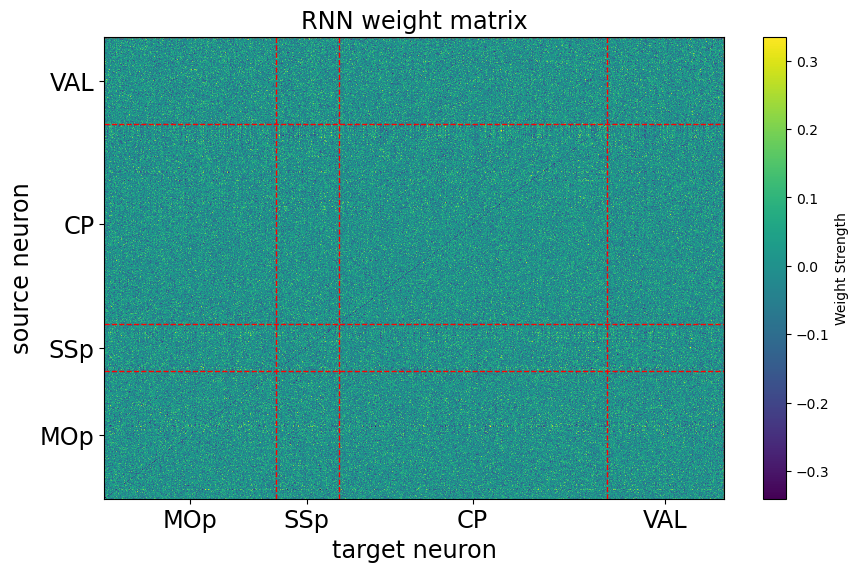

In [69]:
weight_matrix_fig = pltz.plot_rnn_weight_matrix(rnn_model, regions_arr)

### Firing rate analysis

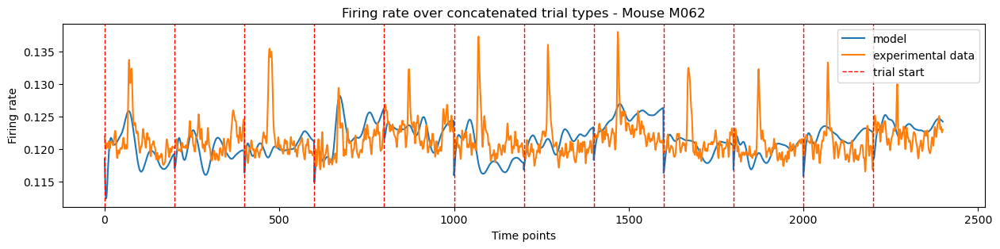

In [70]:
fr_fig = pltz.plot_firing_rates(rnn_model_, reset_points, mouse)

/home/zms24/Desktop/earthquake-analysis/tools/rnn_and_curbd/plotting.py:275: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


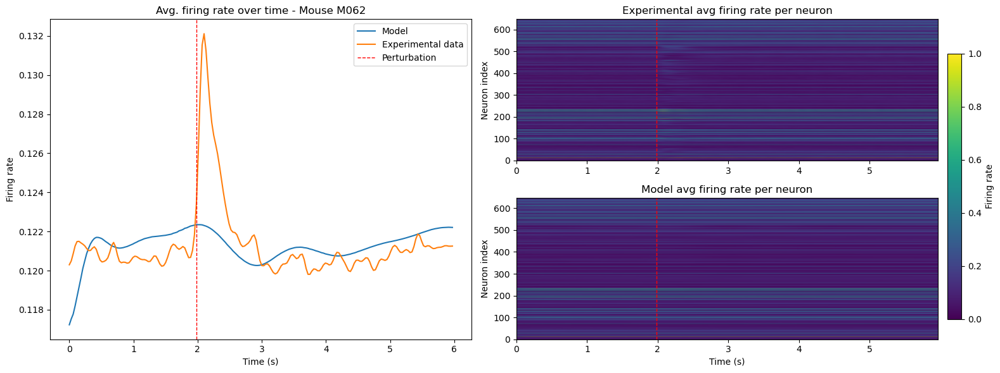

In [71]:
avg_fr_fig = pltz.plot_avg_firing_rates(rnn_model_, shapes, perturbation_time_sec, bin_size=BIN_SIZE, mouse_num=mouse)

## CURBD

In [72]:
curbd_arr, curbd_labels = curbd.computeCURBD(rnn_model)
n_regions = curbd_arr.shape[0]
currents, current_labels = curbdz.format_curbd_output(curbd_arr, curbd_labels, n_regions, reset_points)

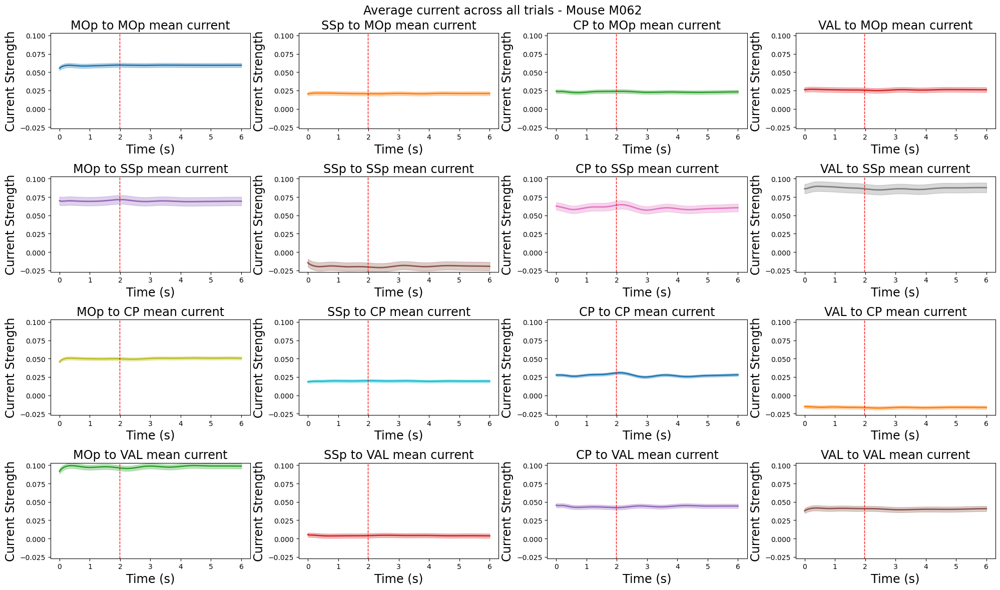

In [73]:
currents_fig = pltz.plot_currents_by_region(currents, current_labels, perturbation_time_sec, BIN_SIZE, dtFactor, mouse)

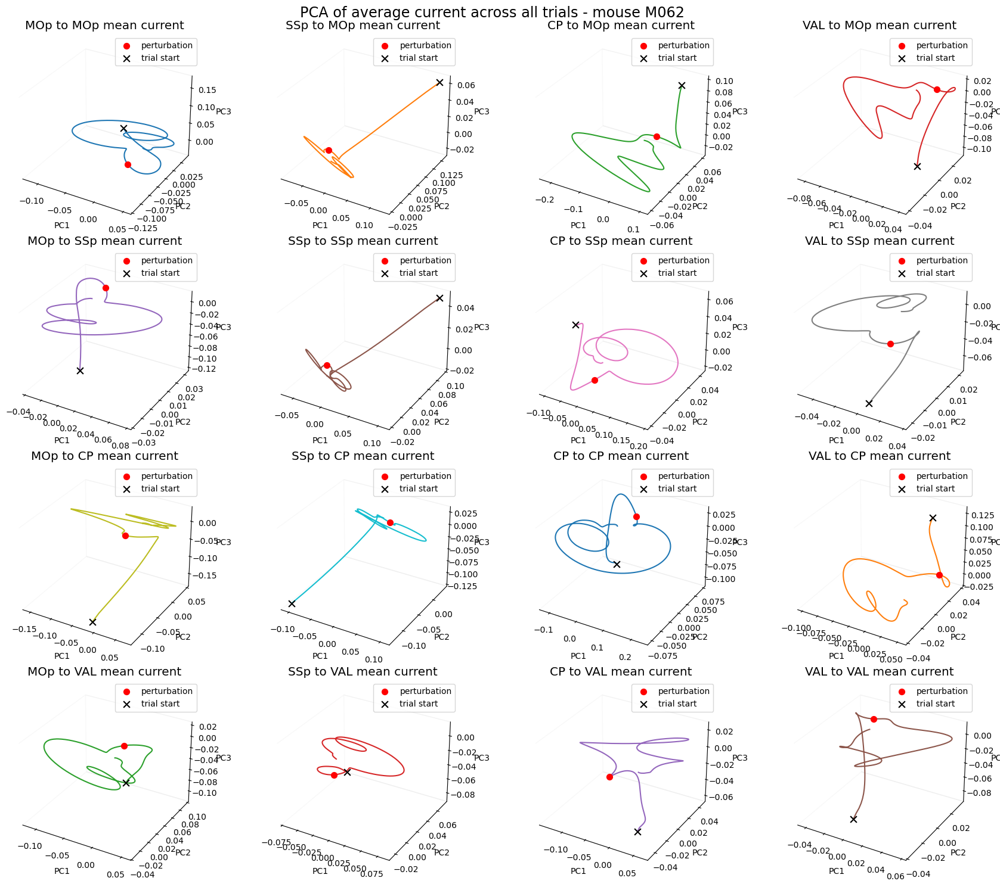

In [74]:
pca_current_fig = pltz.plot_pca_currents(currents, current_labels, perturbation_time, mouse, fig_size = (18, 15))

### Saving RNN model

In [75]:
rnn_model_to_save = rnn_model.copy()
try:
    if isinstance(rnn_model_to_save['params'].get('nonLinearity'), np.ufunc):
        rnn_model_to_save['params']['nonLinearity'] = rnn_model_to_save['params']['nonLinearity'].__name__
    savemat(f"rnn_model_{mouse}.mat", {"rnn_model": rnn_model_to_save})
except Exception as e:
    print(f"Error saving RNN model for mouse {mouse}:", e)